In [ ]:
!nvidia-smi

Fri Jan 12 23:09:03 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

directory_path = '/content/drive/MyDrive/AAAI'#@param {type:"string"}
folder_name = "images"  #@param {type:"string"}
directory_path_image = f'{directory_path}/{folder_name}'

In [ ]:
!pip install diffusers==0.12.1 transformers==4.28.1 ftfy accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 604.0/604.0 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 44.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 30.5 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.15.0
    Uninstalling tokenizers-0.15.0:
      Successfully uninstalled tokenizers-0.15.0
  Attempting uninstall: transformers
    Found existing installation: transformers 4.35.2
    Uninstalling transformers-4.35.2:
      Successfully uninstalled transformers-4.35.2


In [ ]:
from PIL import Image as PILImage
import os
import torch
from transformers import BlipProcessor, BlipForConditionalGeneration, CLIPTextModel, CLIPVisionModel, CLIPTokenizer
from diffusers import StableDiffusionPipeline
from IPython.display import Image, display

def generate_image(prompt, num_images, save_dir, compression_quality):
    device = "cuda"
    model_id = "CompVis/stable-diffusion-v1-4"

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Generate the pipeline
    pipe = StableDiffusionPipeline.from_pretrained(model_id, revision="fp16", torch_dtype=torch.float16)
    pipe = pipe.to(device)

    for i in range(num_images):
        # Execute the pipeline
        generator = torch.Generator().manual_seed(60 + i)  # Change seed for each image
        with torch.autocast("cuda"):
            image = pipe(prompt, guidance_scale=7.5, generator=generator).images[0]

        # Save the image with a unique filename in the specified directory
        filename = os.path.join(save_dir, f"{prompt[:10]}_{i + 51}.jpg")
        image.save(filename, quality=compression_quality, optimize=True)

        # Print the size of the image file
        file_size = os.path.getsize(filename)
        print(f"Image {i + 1}: {filename}, Size: {file_size} bytes")
        display(Image(filename=filename))

model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/572 [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/307 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/788 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/550 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

Image 1: /content/drive/MyDrive/AAAI/images/power outl_51.jpg, Size: 10254 bytes


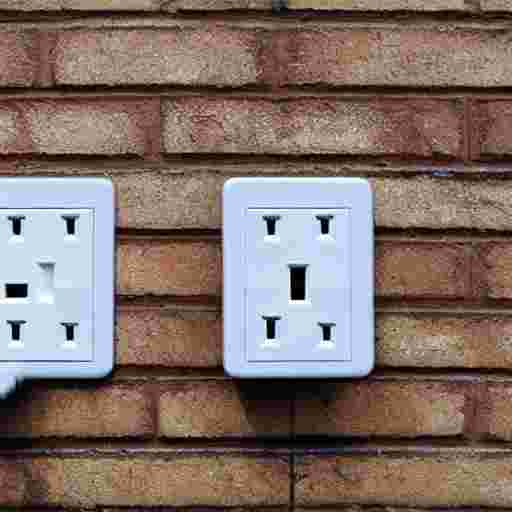

  0%|          | 0/50 [00:00<?, ?it/s]

Image 2: /content/drive/MyDrive/AAAI/images/power outl_52.jpg, Size: 5767 bytes


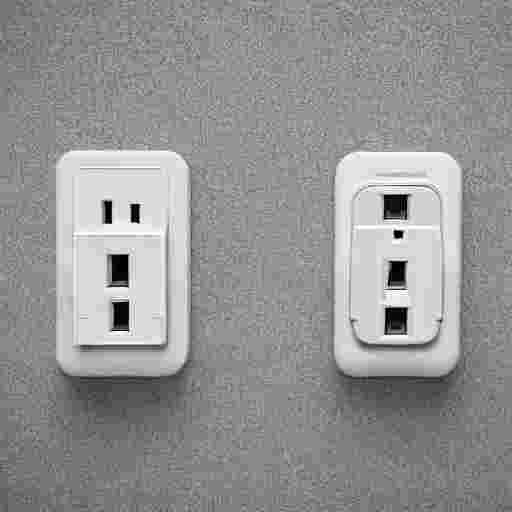

  0%|          | 0/50 [00:00<?, ?it/s]

Image 3: /content/drive/MyDrive/AAAI/images/power outl_53.jpg, Size: 5273 bytes


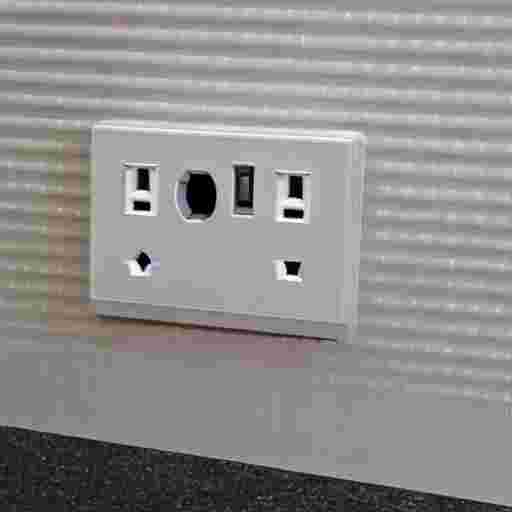

  0%|          | 0/50 [00:00<?, ?it/s]

Image 4: /content/drive/MyDrive/AAAI/images/power outl_54.jpg, Size: 3776 bytes


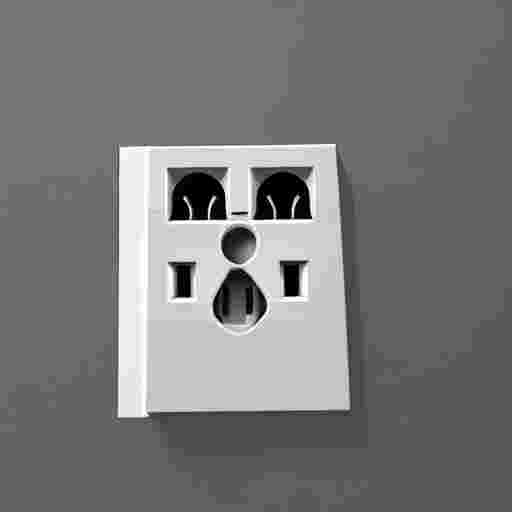

  0%|          | 0/50 [00:00<?, ?it/s]

Image 5: /content/drive/MyDrive/AAAI/images/power outl_55.jpg, Size: 6385 bytes


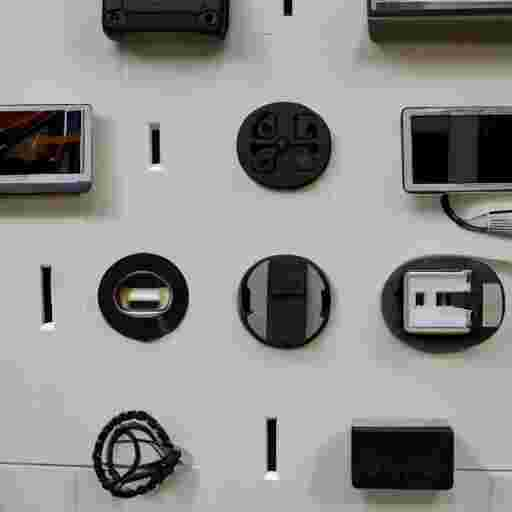

  0%|          | 0/50 [00:00<?, ?it/s]

Image 6: /content/drive/MyDrive/AAAI/images/power outl_56.jpg, Size: 9066 bytes


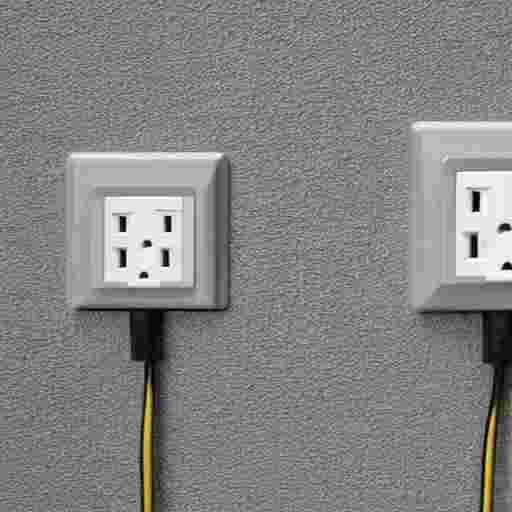

  0%|          | 0/50 [00:00<?, ?it/s]

Image 7: /content/drive/MyDrive/AAAI/images/power outl_57.jpg, Size: 4941 bytes


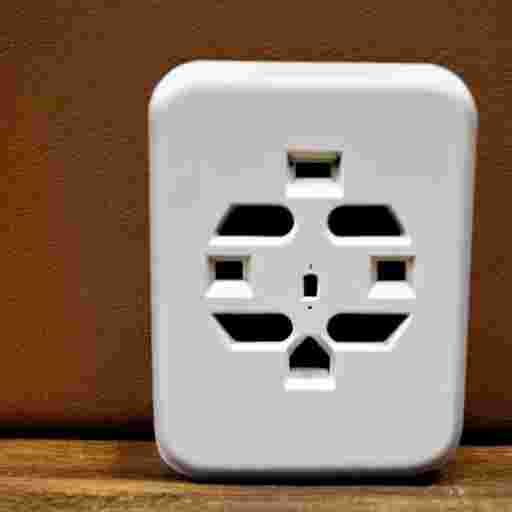

  0%|          | 0/50 [00:00<?, ?it/s]

Image 8: /content/drive/MyDrive/AAAI/images/power outl_58.jpg, Size: 4734 bytes


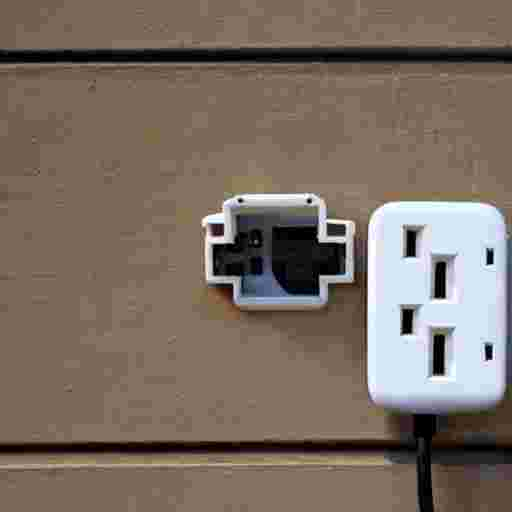

  0%|          | 0/50 [00:00<?, ?it/s]

Image 9: /content/drive/MyDrive/AAAI/images/power outl_59.jpg, Size: 3787 bytes


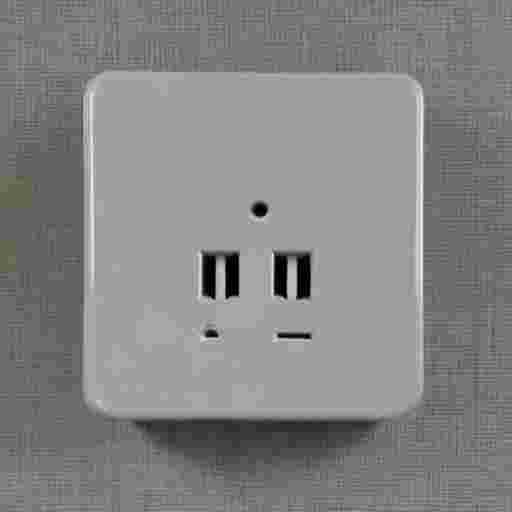

  0%|          | 0/50 [00:00<?, ?it/s]

Image 10: /content/drive/MyDrive/AAAI/images/power outl_60.jpg, Size: 5728 bytes


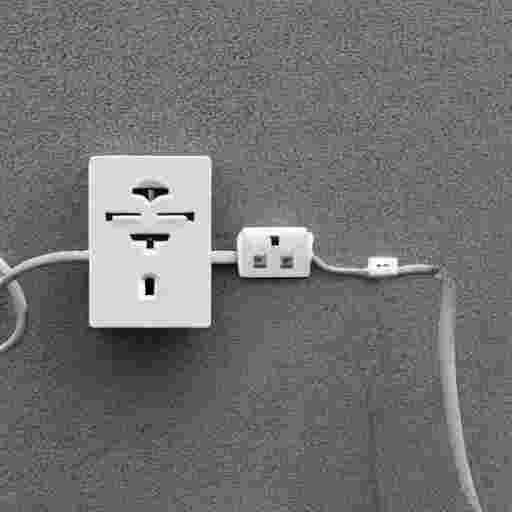

  0%|          | 0/50 [00:00<?, ?it/s]

Image 11: /content/drive/MyDrive/AAAI/images/power outl_61.jpg, Size: 5782 bytes


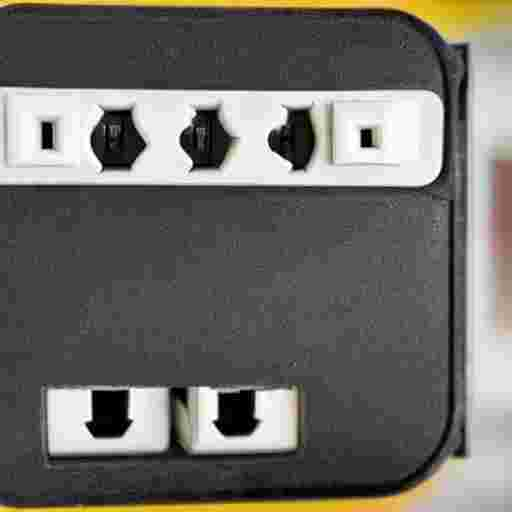

  0%|          | 0/50 [00:00<?, ?it/s]

Image 12: /content/drive/MyDrive/AAAI/images/power outl_62.jpg, Size: 3869 bytes


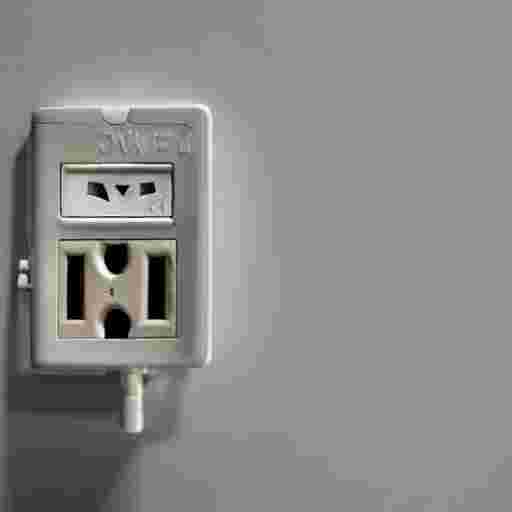

  0%|          | 0/50 [00:00<?, ?it/s]

Image 13: /content/drive/MyDrive/AAAI/images/power outl_63.jpg, Size: 7085 bytes


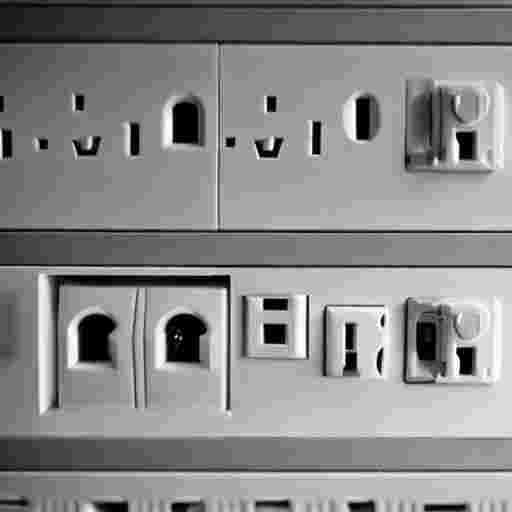

  0%|          | 0/50 [00:00<?, ?it/s]

Image 14: /content/drive/MyDrive/AAAI/images/power outl_64.jpg, Size: 4813 bytes


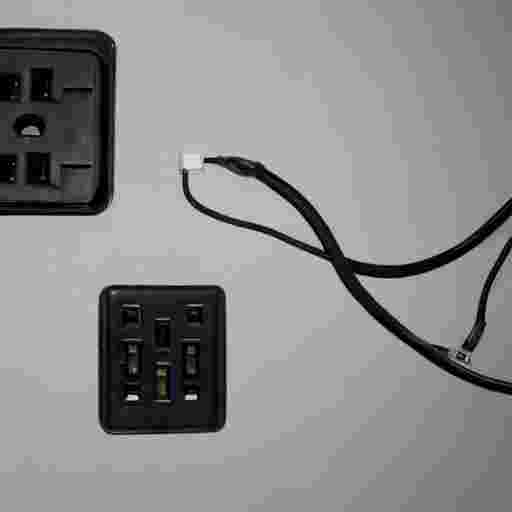

  0%|          | 0/50 [00:00<?, ?it/s]

Image 15: /content/drive/MyDrive/AAAI/images/power outl_65.jpg, Size: 7266 bytes


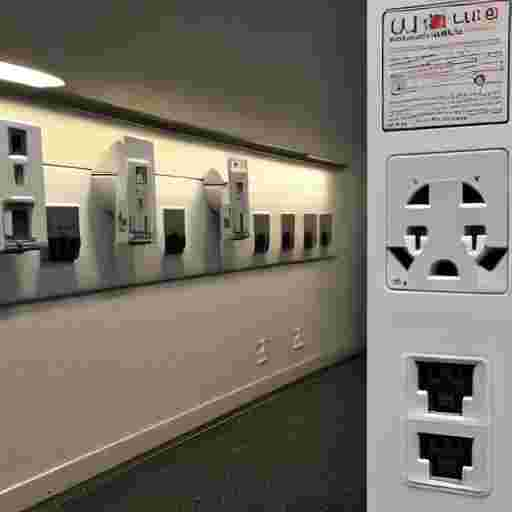

  0%|          | 0/50 [00:00<?, ?it/s]

Image 16: /content/drive/MyDrive/AAAI/images/power outl_66.jpg, Size: 5922 bytes


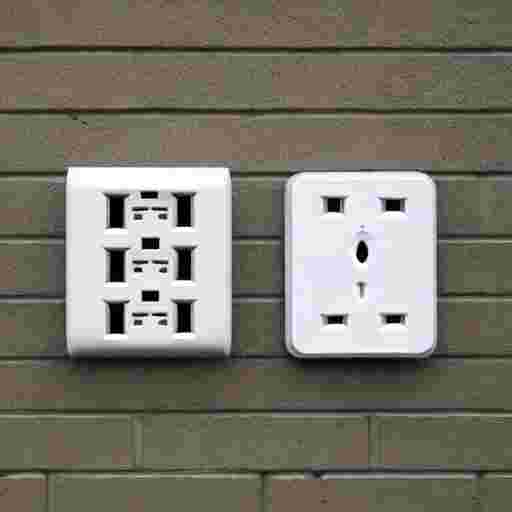

  0%|          | 0/50 [00:00<?, ?it/s]

Image 17: /content/drive/MyDrive/AAAI/images/power outl_67.jpg, Size: 7783 bytes


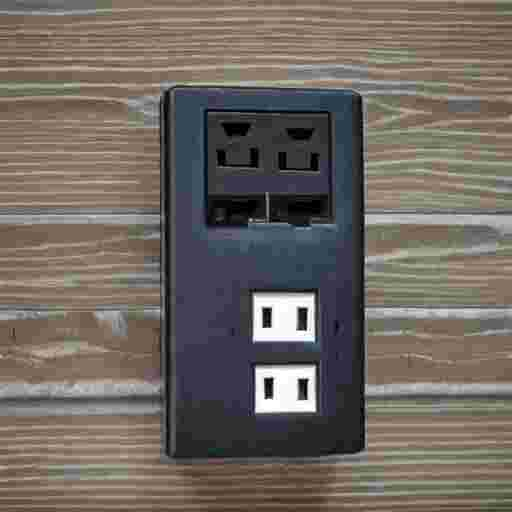

  0%|          | 0/50 [00:00<?, ?it/s]

Image 18: /content/drive/MyDrive/AAAI/images/power outl_68.jpg, Size: 4202 bytes


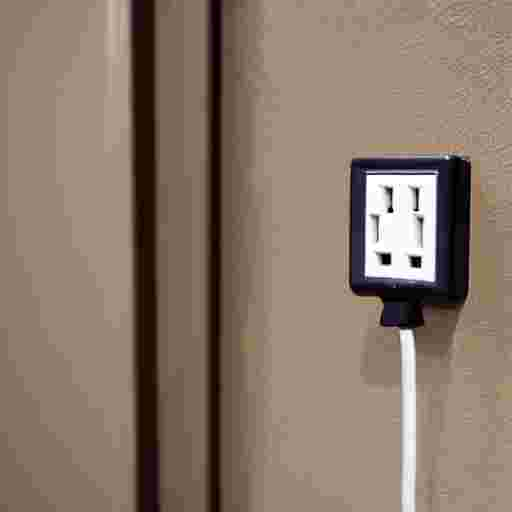

  0%|          | 0/50 [00:00<?, ?it/s]

Image 19: /content/drive/MyDrive/AAAI/images/power outl_69.jpg, Size: 8455 bytes


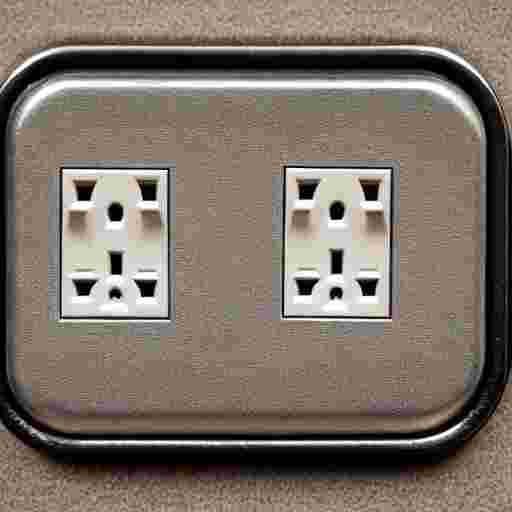

  0%|          | 0/50 [00:00<?, ?it/s]

Image 20: /content/drive/MyDrive/AAAI/images/power outl_70.jpg, Size: 5079 bytes


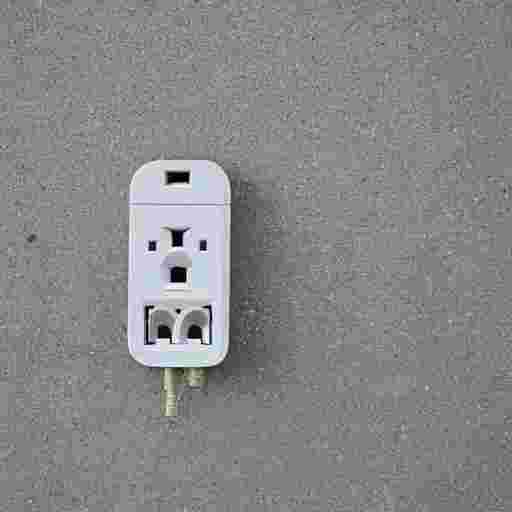

  0%|          | 0/50 [00:00<?, ?it/s]

Image 21: /content/drive/MyDrive/AAAI/images/power outl_71.jpg, Size: 3828 bytes


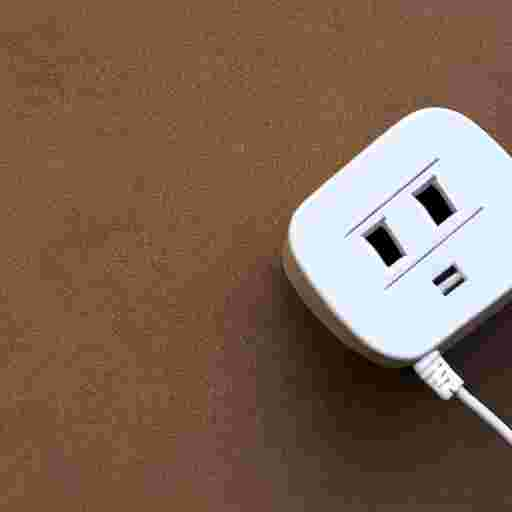

  0%|          | 0/50 [00:00<?, ?it/s]

Image 22: /content/drive/MyDrive/AAAI/images/power outl_72.jpg, Size: 3391 bytes


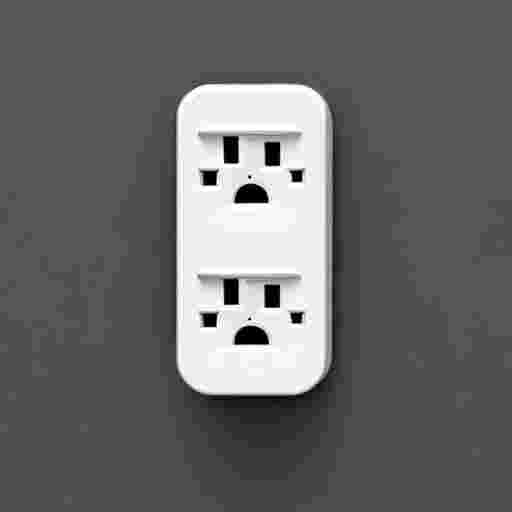

  0%|          | 0/50 [00:00<?, ?it/s]

Image 23: /content/drive/MyDrive/AAAI/images/power outl_73.jpg, Size: 5329 bytes


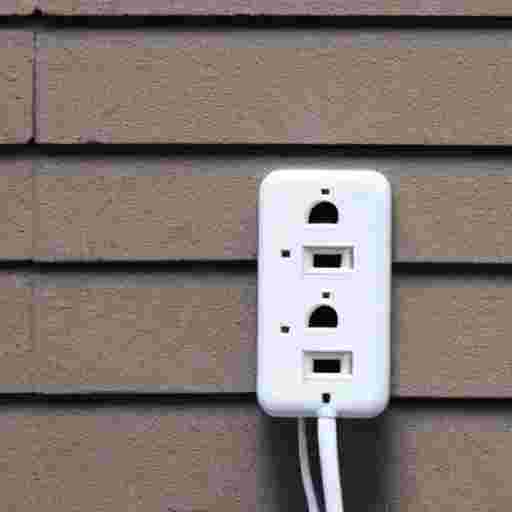

  0%|          | 0/50 [00:00<?, ?it/s]

Image 24: /content/drive/MyDrive/AAAI/images/power outl_74.jpg, Size: 4880 bytes


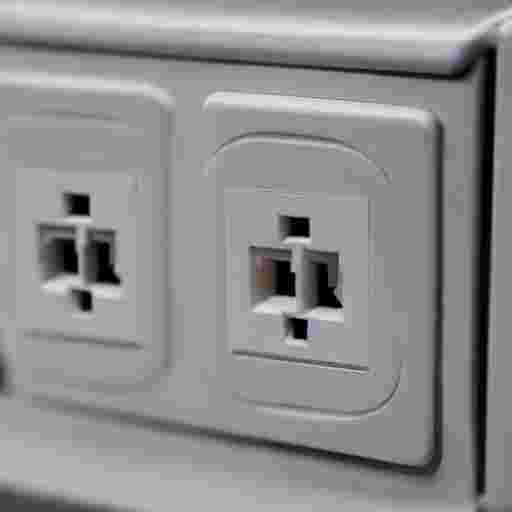

  0%|          | 0/50 [00:00<?, ?it/s]

Image 25: /content/drive/MyDrive/AAAI/images/power outl_75.jpg, Size: 3408 bytes


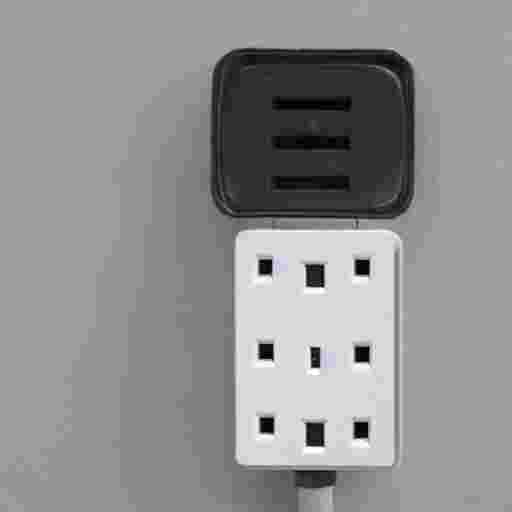

  0%|          | 0/50 [00:00<?, ?it/s]

Image 26: /content/drive/MyDrive/AAAI/images/power outl_76.jpg, Size: 4133 bytes


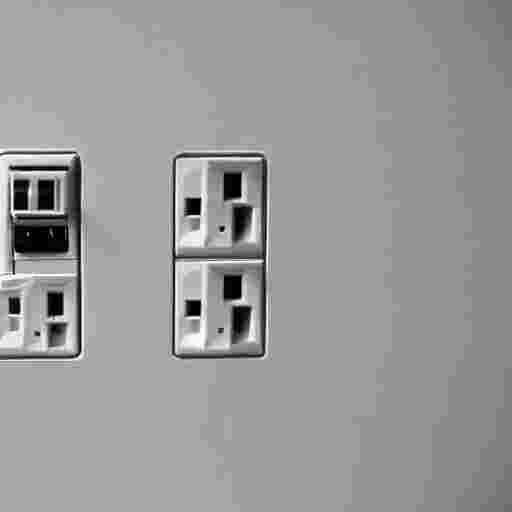

  0%|          | 0/50 [00:00<?, ?it/s]

Image 27: /content/drive/MyDrive/AAAI/images/power outl_77.jpg, Size: 10416 bytes


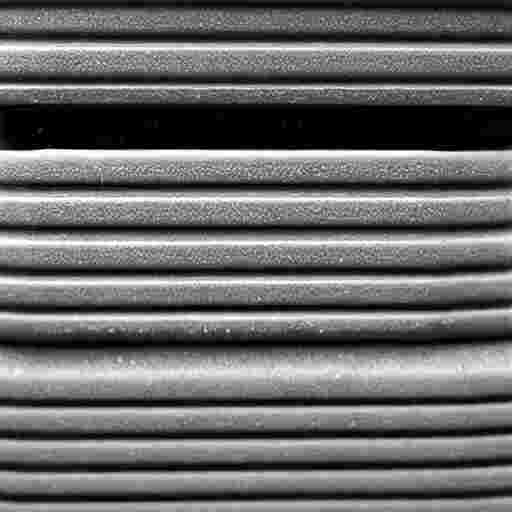

  0%|          | 0/50 [00:00<?, ?it/s]

Image 28: /content/drive/MyDrive/AAAI/images/power outl_78.jpg, Size: 6190 bytes


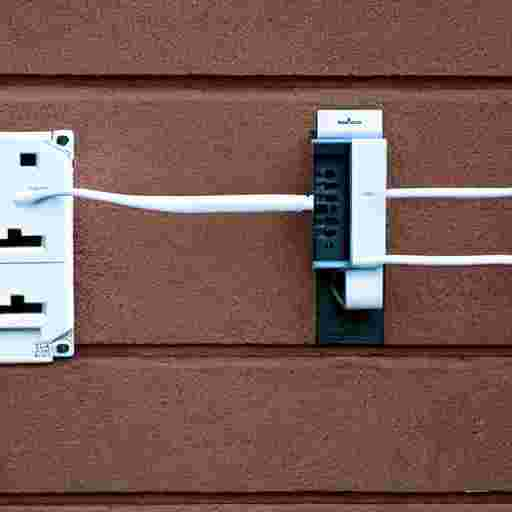

  0%|          | 0/50 [00:00<?, ?it/s]

Image 29: /content/drive/MyDrive/AAAI/images/power outl_79.jpg, Size: 3873 bytes


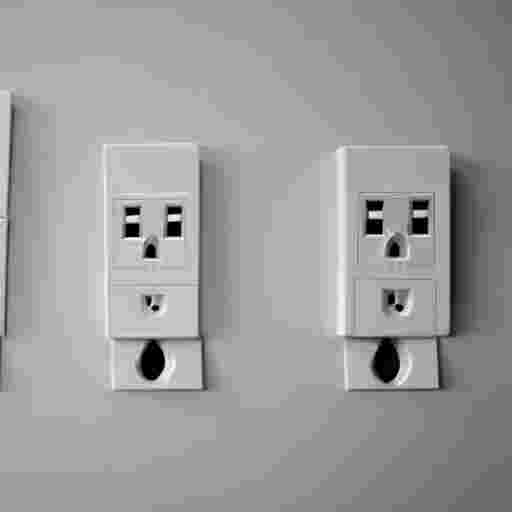

  0%|          | 0/50 [00:00<?, ?it/s]

Image 30: /content/drive/MyDrive/AAAI/images/power outl_80.jpg, Size: 4382 bytes


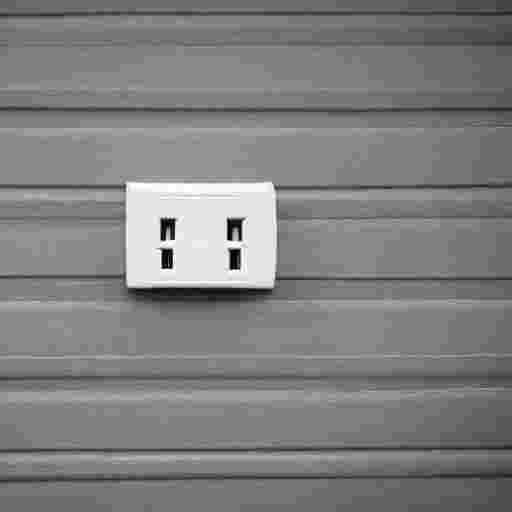

  0%|          | 0/50 [00:00<?, ?it/s]

Image 31: /content/drive/MyDrive/AAAI/images/power outl_81.jpg, Size: 4120 bytes


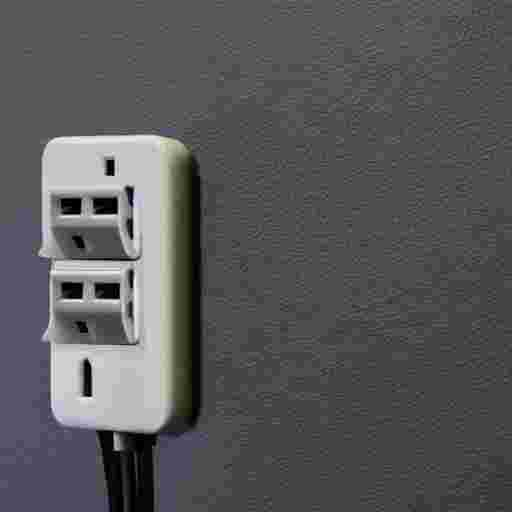

  0%|          | 0/50 [00:00<?, ?it/s]

Image 32: /content/drive/MyDrive/AAAI/images/power outl_82.jpg, Size: 7207 bytes


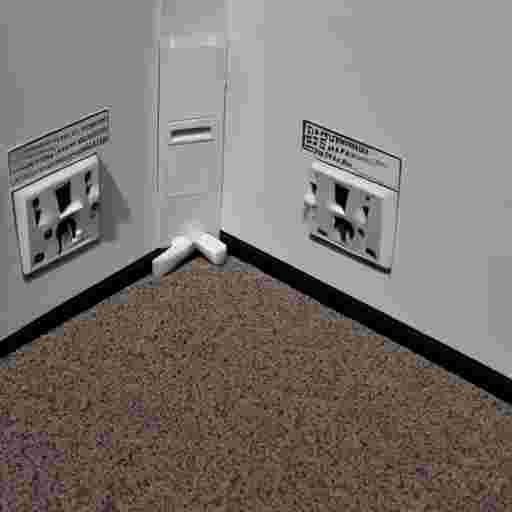

  0%|          | 0/50 [00:00<?, ?it/s]

Image 33: /content/drive/MyDrive/AAAI/images/power outl_83.jpg, Size: 3792 bytes


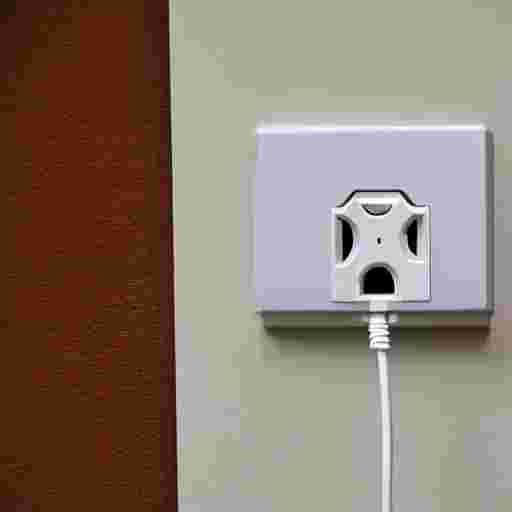

  0%|          | 0/50 [00:00<?, ?it/s]

Image 34: /content/drive/MyDrive/AAAI/images/power outl_84.jpg, Size: 3895 bytes


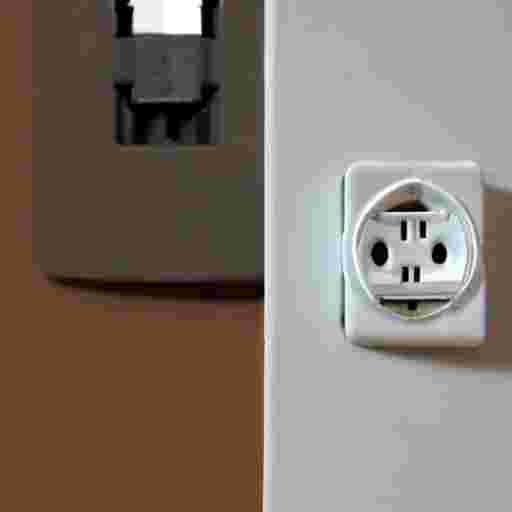

  0%|          | 0/50 [00:00<?, ?it/s]

Image 35: /content/drive/MyDrive/AAAI/images/power outl_85.jpg, Size: 3671 bytes


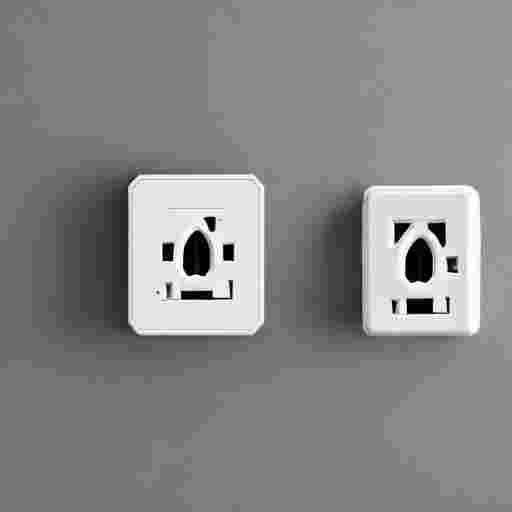

  0%|          | 0/50 [00:00<?, ?it/s]

Image 36: /content/drive/MyDrive/AAAI/images/power outl_86.jpg, Size: 3649 bytes


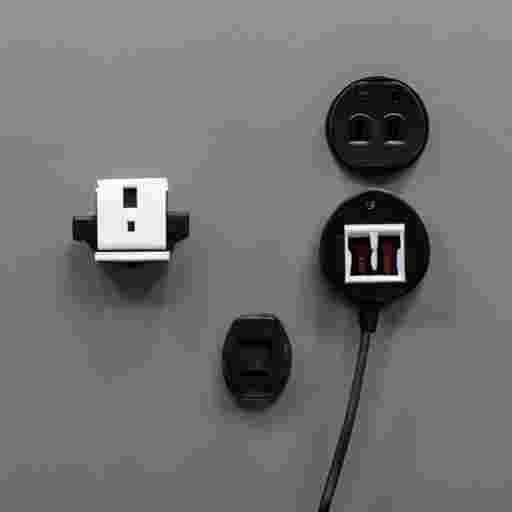

  0%|          | 0/50 [00:00<?, ?it/s]

Image 37: /content/drive/MyDrive/AAAI/images/power outl_87.jpg, Size: 9874 bytes


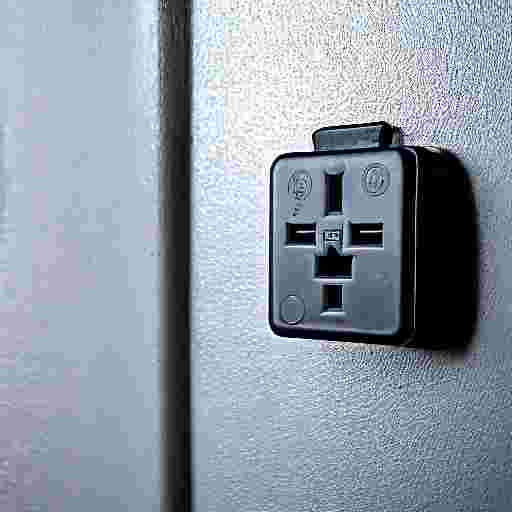

  0%|          | 0/50 [00:00<?, ?it/s]

Image 38: /content/drive/MyDrive/AAAI/images/power outl_88.jpg, Size: 9335 bytes


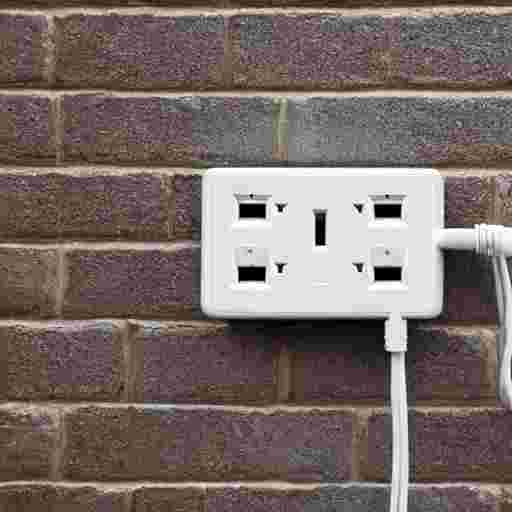

  0%|          | 0/50 [00:00<?, ?it/s]

Image 39: /content/drive/MyDrive/AAAI/images/power outl_89.jpg, Size: 3794 bytes


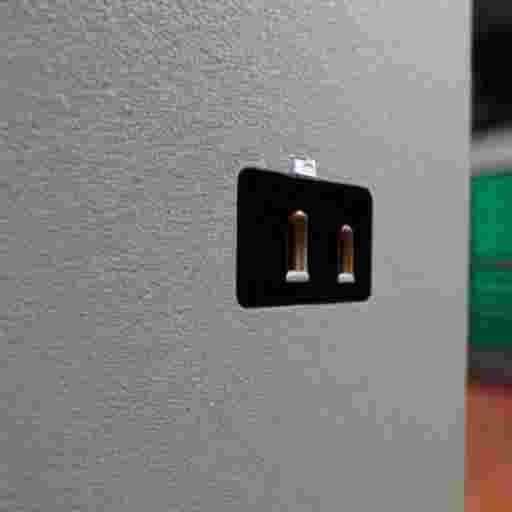

  0%|          | 0/50 [00:00<?, ?it/s]

Image 40: /content/drive/MyDrive/AAAI/images/power outl_90.jpg, Size: 6607 bytes


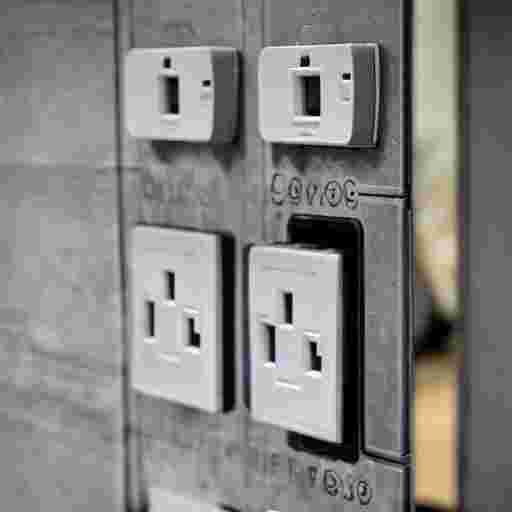

  0%|          | 0/50 [00:00<?, ?it/s]

Image 41: /content/drive/MyDrive/AAAI/images/power outl_91.jpg, Size: 4580 bytes


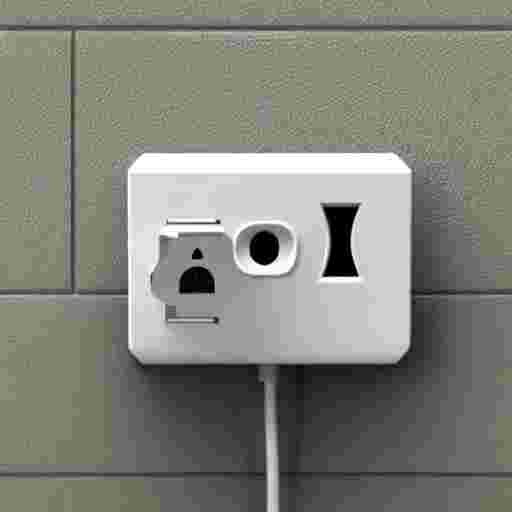

  0%|          | 0/50 [00:00<?, ?it/s]

Image 42: /content/drive/MyDrive/AAAI/images/power outl_92.jpg, Size: 5231 bytes


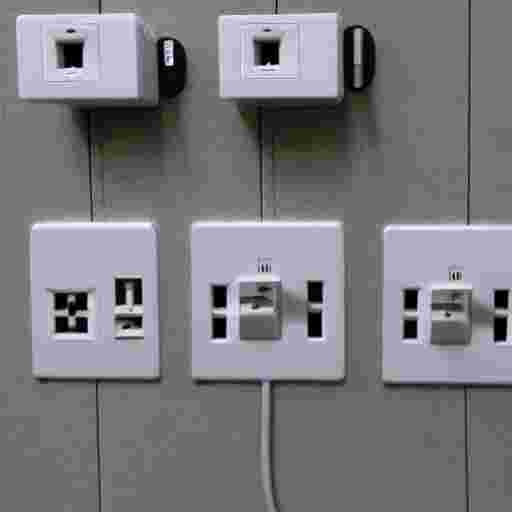

  0%|          | 0/50 [00:00<?, ?it/s]

Image 43: /content/drive/MyDrive/AAAI/images/power outl_93.jpg, Size: 4344 bytes


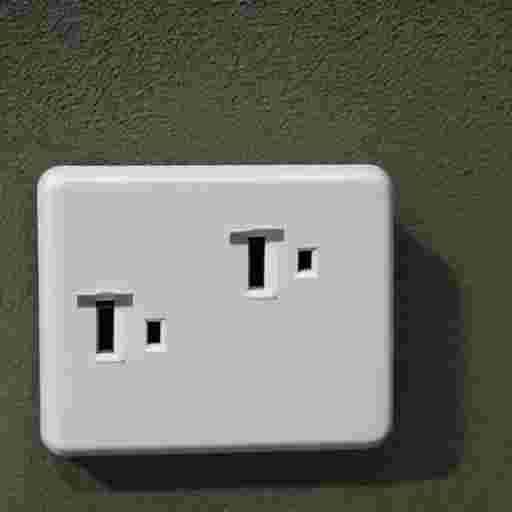

  0%|          | 0/50 [00:00<?, ?it/s]

Image 44: /content/drive/MyDrive/AAAI/images/power outl_94.jpg, Size: 6965 bytes


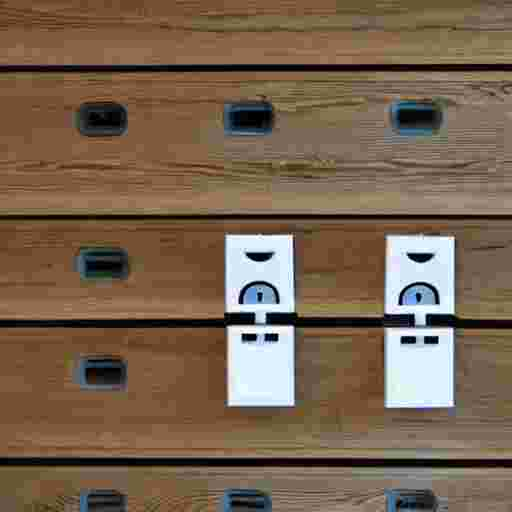

  0%|          | 0/50 [00:00<?, ?it/s]

Image 45: /content/drive/MyDrive/AAAI/images/power outl_95.jpg, Size: 5001 bytes


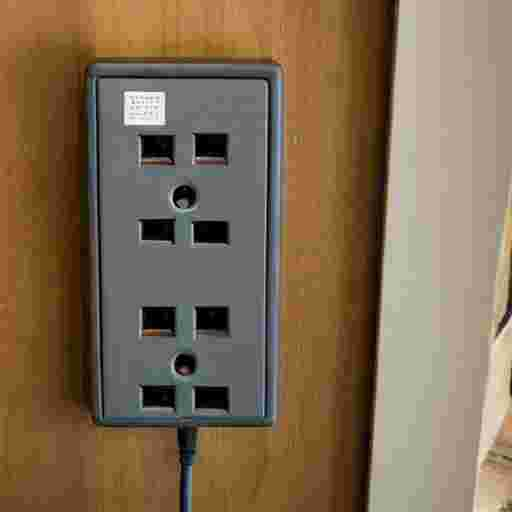

  0%|          | 0/50 [00:00<?, ?it/s]

Image 46: /content/drive/MyDrive/AAAI/images/power outl_96.jpg, Size: 8072 bytes


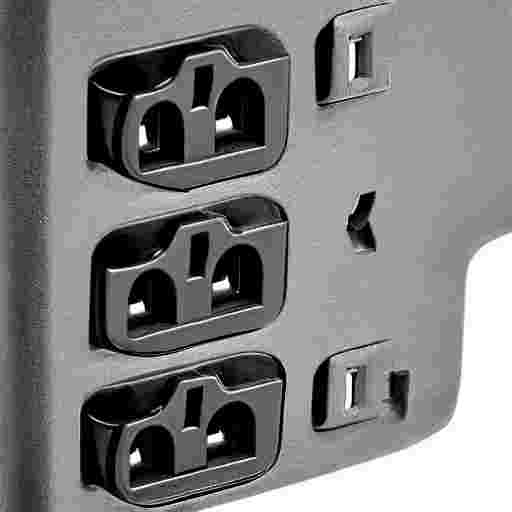

  0%|          | 0/50 [00:00<?, ?it/s]

Image 47: /content/drive/MyDrive/AAAI/images/power outl_97.jpg, Size: 3436 bytes


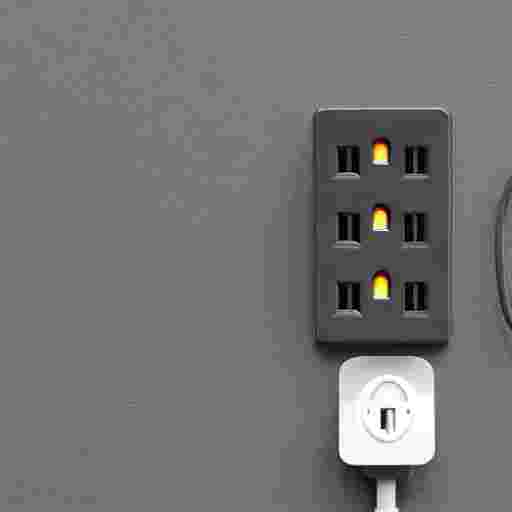

  0%|          | 0/50 [00:00<?, ?it/s]

Image 48: /content/drive/MyDrive/AAAI/images/power outl_98.jpg, Size: 7667 bytes


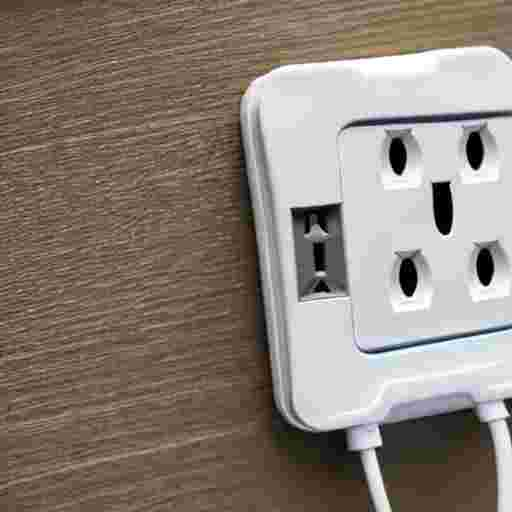

  0%|          | 0/50 [00:00<?, ?it/s]

Image 49: /content/drive/MyDrive/AAAI/images/power outl_99.jpg, Size: 3399 bytes


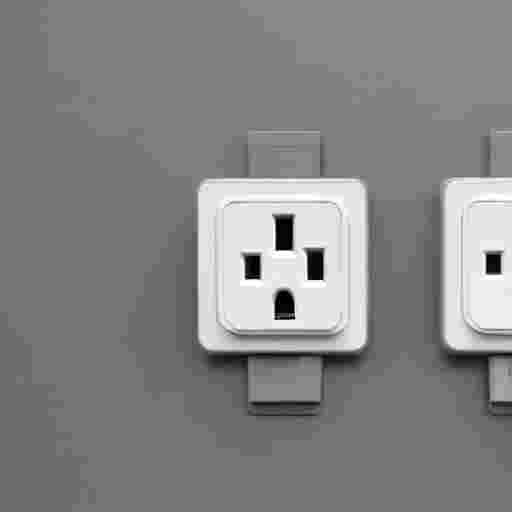

  0%|          | 0/50 [00:00<?, ?it/s]

Image 50: /content/drive/MyDrive/AAAI/images/power outl_100.jpg, Size: 6309 bytes


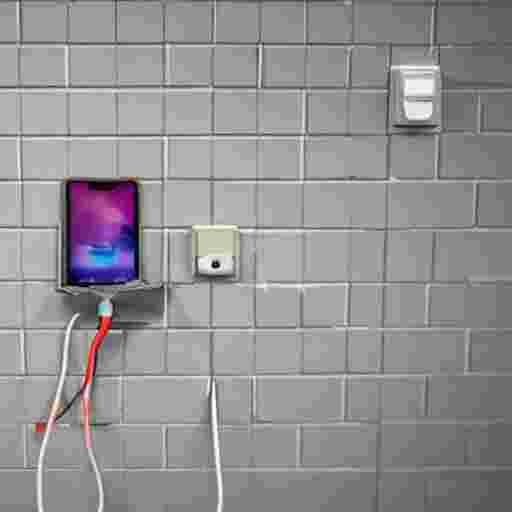

In [ ]:
# Parameters
prompt = "power outlets" #@param {type:"string"}
num_images = 50 #@param {type:"integer"}
save_dir = directory_path_image
compression_quality = 10 #@param {type:"integer"}
# Generate and save images
generate_image(prompt, num_images, save_dir, compression_quality)

In [ ]:
!pip install OpenAI

In [ ]:
import datetime
import time
import requests
import os

from PIL import Image
from io import BytesIO
from openai import OpenAI

# Parameters
api_key = "enter your api key" #@param {type:"string"}
prompt = "few white german power outlets which It is circular and has two outlets on the left and right and a ground on the top and bottom" #@param {type:"string"}
num_images = 60 #@param {type:"integer"}
client = OpenAI(api_key= api_key )


for j in range(0, num_images, 5):
    response = client.images.generate(
        model="dall-e-2",
        prompt=prompt,
        size="256x256",
        quality="standard",
        n=min(5, num_images - j)
    )

    for i, image_data in enumerate(response.data):
        image_url = image_data.url
        timestamp = datetime.datetime.now().strftime("%Y%m%d%H%M%S")
        file_name = f"image{j+i+1}{timestamp}.jpg"
        file_path = directory_path_image

        response = requests.get(image_url)
        image = Image.open(BytesIO(response.content))

        quality = 20
        image.save(file_path, 'JPEG', quality=quality)

        print(f"Saved image size: {os.path.getsize(file_path)} bytes")

    if j + 5 < num_images:
        time.sleep(60)


In [ ]:
!pip install -q \
autodistill \
autodistill-grounded-sam \
autodistill-yolov8 \
roboflow \
supervision==0.9.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/69.9 kB ? eta -:--:--
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━ 61.4/69.9 kB 3.4 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.9/69.9 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.4/82.4 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.0/527.0 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.1/254.1 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.6 MB/s eta 0:0

In [ ]:
import supervision as sv

image_paths = sv.list_files_with_extensions(
    directory= directory_path_image,
    extensions=["jpg"])

print(image_paths)
print('image count:', len(image_paths))

[PosixPath('/content/drive/MyDrive/AAAI/images/power outl_2.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outl_3.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outl_4.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outl_5.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outl_1.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_6.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_7.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_8.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_9.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_10.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_11.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_12.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_13.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_14.jpg'), PosixPath('/content/drive/MyDrive/AAAI/images/power outle_15.

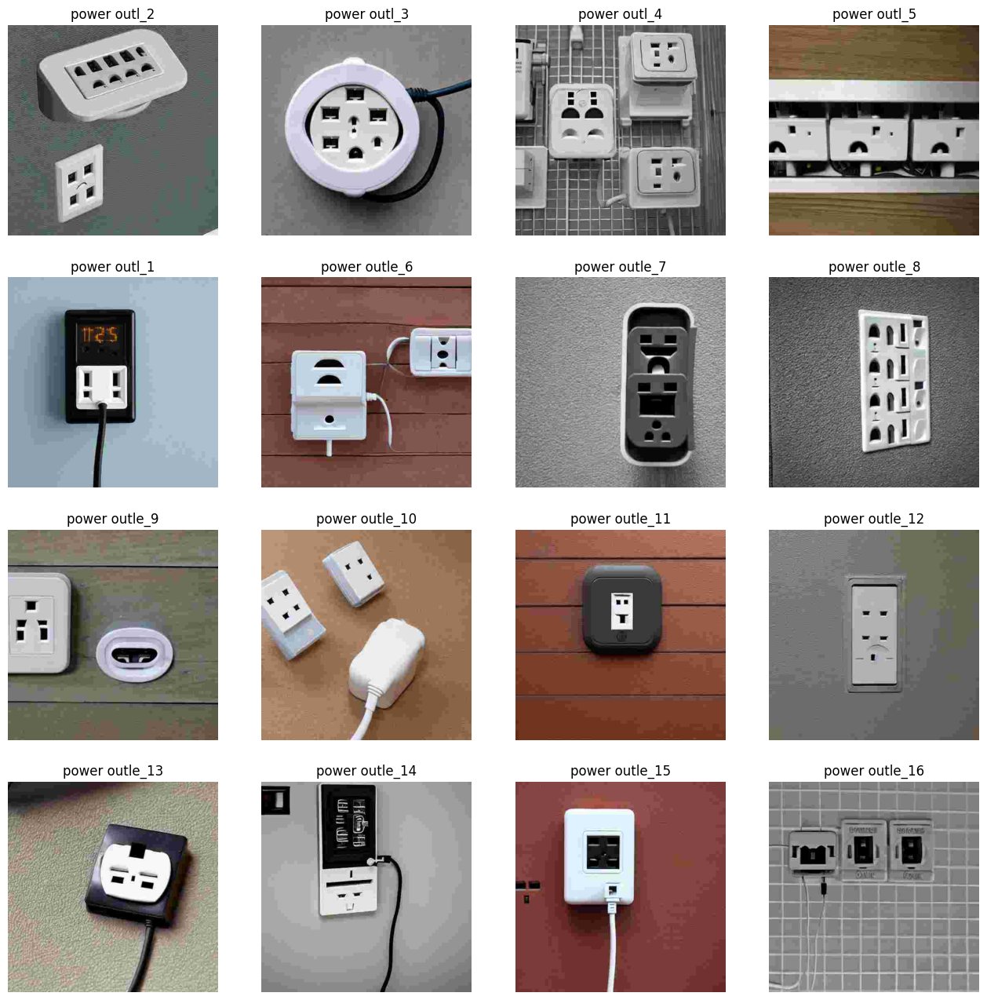

In [ ]:
import cv2

SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

In [ ]:
from autodistill.detection import CaptionOntology

os.chdir(directory_path)
print("Current Directory:", os.getcwd())

ontology=CaptionOntology({
    "power outlet": "power outlet",
})

IMAGE_DIR_PATH = f'{directory_path}/images'
DATASET_DIR_PATH = f'{directory_path}/dataset'

In [ ]:
from autodistill_grounded_sam import GroundedSAM

base_model = GroundedSAM(ontology=ontology)
dataset = base_model.label(
    input_folder=IMAGE_DIR_PATH,
    output_folder=DATASET_DIR_PATH,
    record_confidence= True)

trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Labeling /content/drive/MyDrive/AAAI/images/power outl_100.jpg: 100%|██████████| 100/100 [04:13<00:00,  2.53s/it]


Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outl_2.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outl_3.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outl_4.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outl_5.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outl_1.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outle_6.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outle_7.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outle_8.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outle_9.txt
Saved confidence file: /content/drive/MyDrive/AAAI//dataset/annotations/confidence-power outle_1

In [ ]:
IMAGES_DIRECTORY_PATH = f'{directory_path}/dataset/train/images'
ANNOTATIONS_DIRECTORY_PATH = f'{directory_path}/dataset/train/labels'
DATA_YAML_PATH = f'{directory_path}/dataset/data.yaml'

In [ ]:
import supervision as sv

dataset = sv.DetectionDataset.from_yolo(
    images_directory_path=IMAGES_DIRECTORY_PATH,
    annotations_directory_path=ANNOTATIONS_DIRECTORY_PATH,
    data_yaml_path=DATA_YAML_PATH)

len(dataset)

80

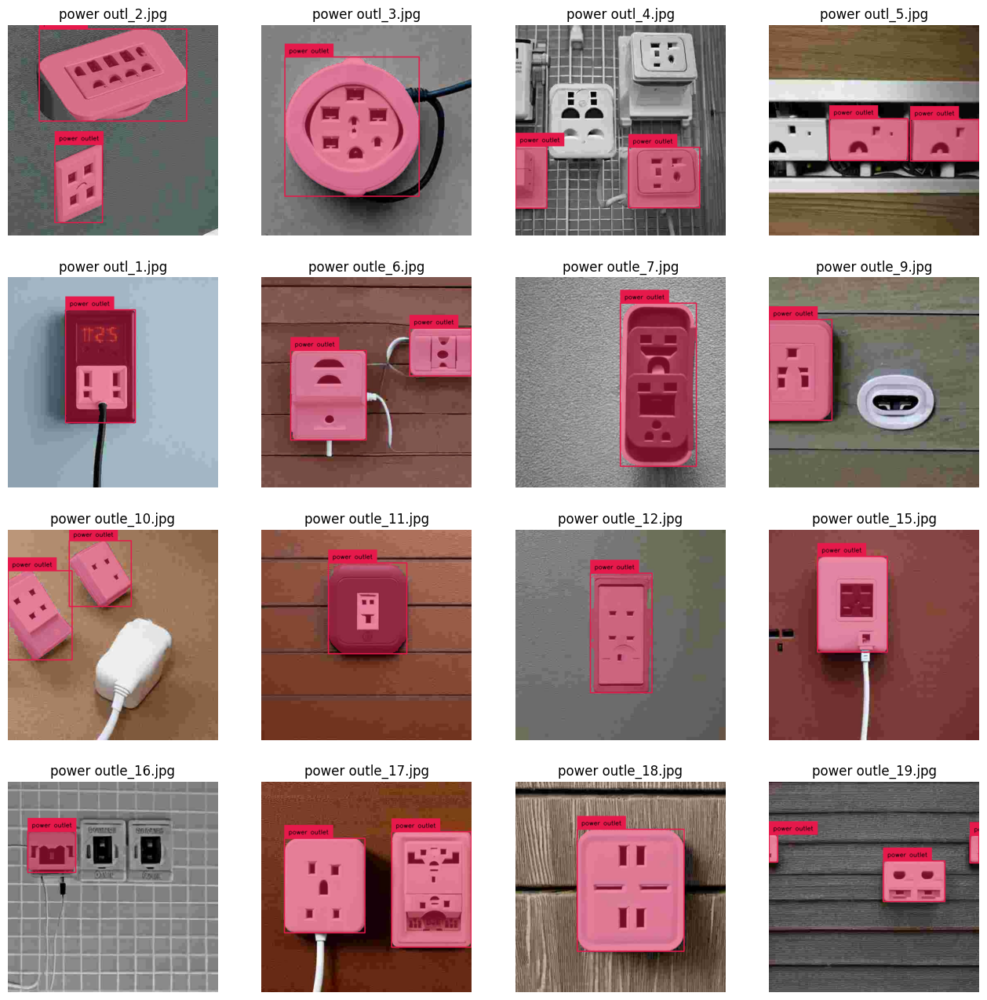

In [ ]:
import supervision as sv

image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

mask_annotator = sv.MaskAnnotator()
box_annotator = sv.BoxAnnotator()

images = []
for image_name in image_names:
    image = dataset.images[image_name]
    annotations = dataset.annotations[image_name]
    labels = [
        dataset.classes[class_id]
        for class_id
        in annotations.class_id]
    annotates_image = mask_annotator.annotate(
        scene=image.copy(),
        detections=annotations)
    annotates_image = box_annotator.annotate(
        scene=annotates_image,
        detections=annotations,
        labels=labels)
    images.append(annotates_image)

sv.plot_images_grid(
    images=images,
    titles=image_names,
    grid_size=SAMPLE_GRID_SIZE,
    size=SAMPLE_PLOT_SIZE)

In [ ]:
from autodistill_yolov8 import YOLOv8
import os

os.chdir(directory_path)
print("Current Directory:", os.getcwd())

target_model = YOLOv8("yolov8n.pt")
target_model.train(DATA_YAML_PATH, epochs=30)

Current Directory: /content/drive/MyDrive/AAAI


New https://pypi.org/project/ultralytics/8.1.0 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.81 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/AAAI/dataset/data.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=F

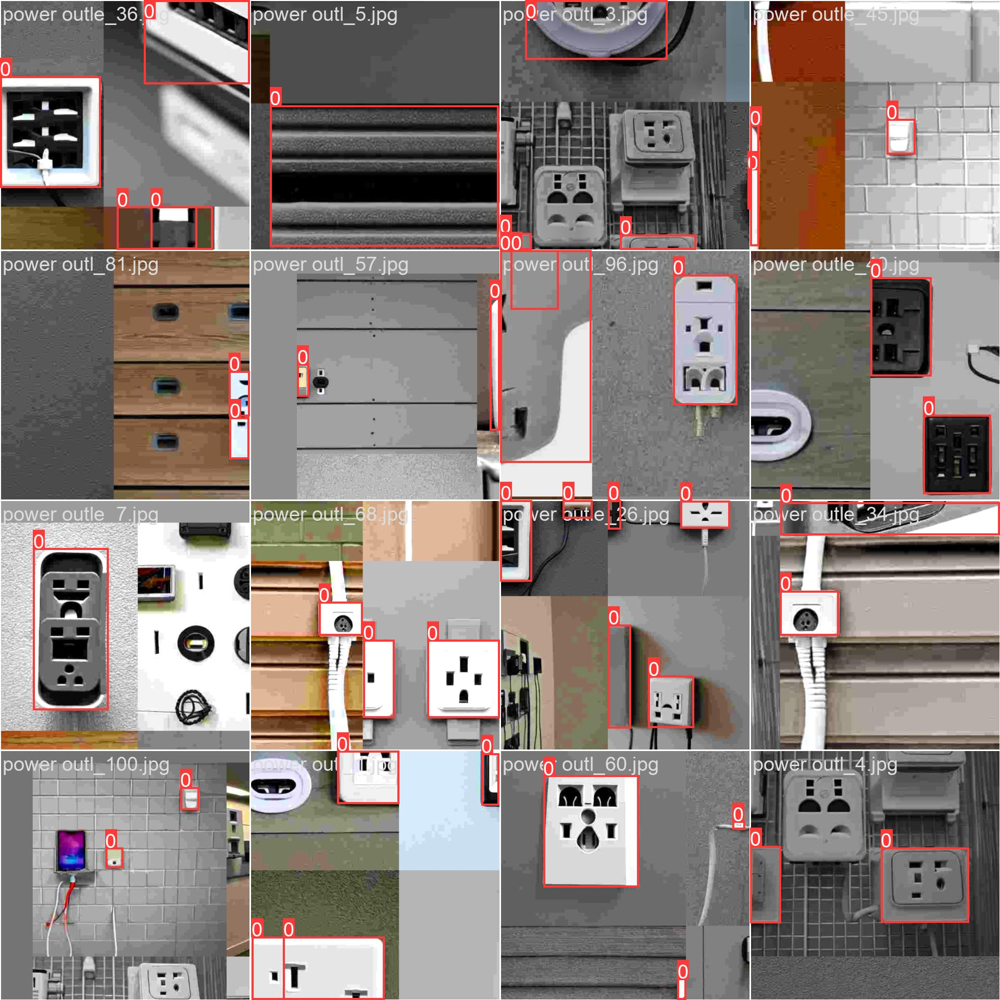

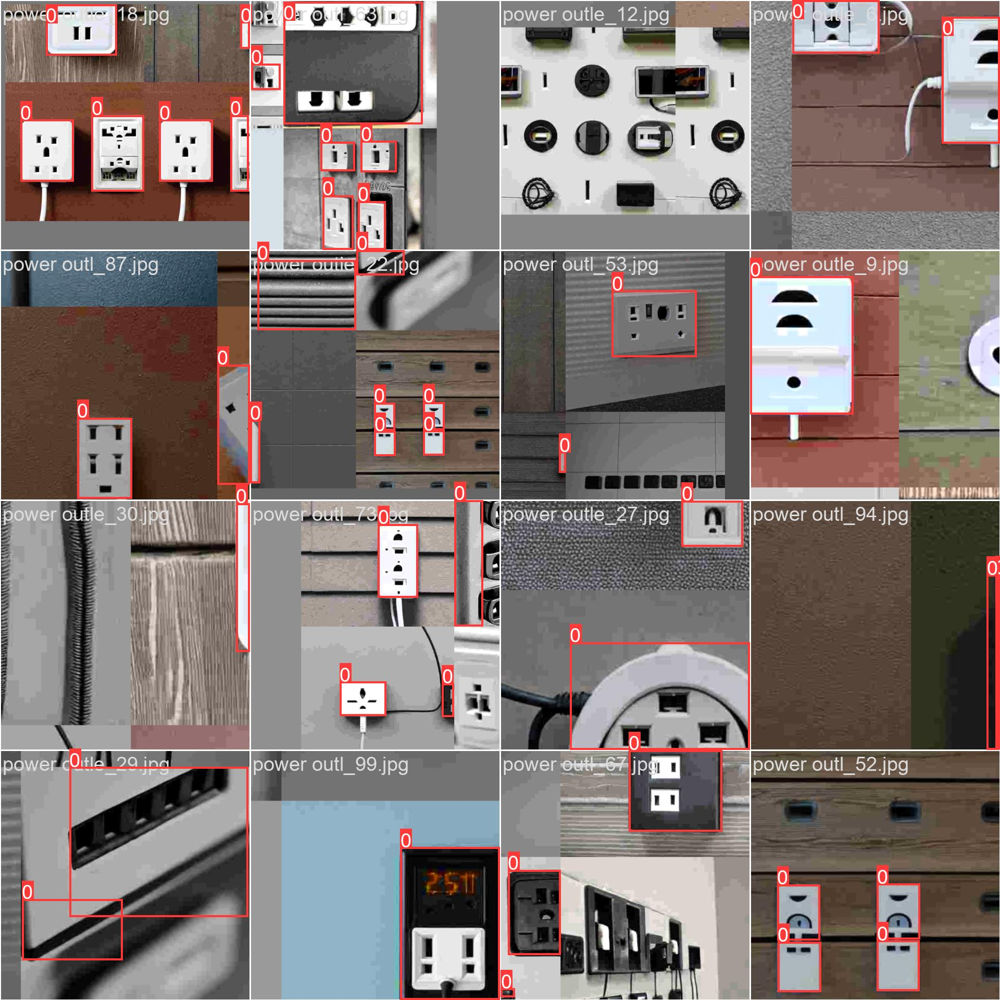

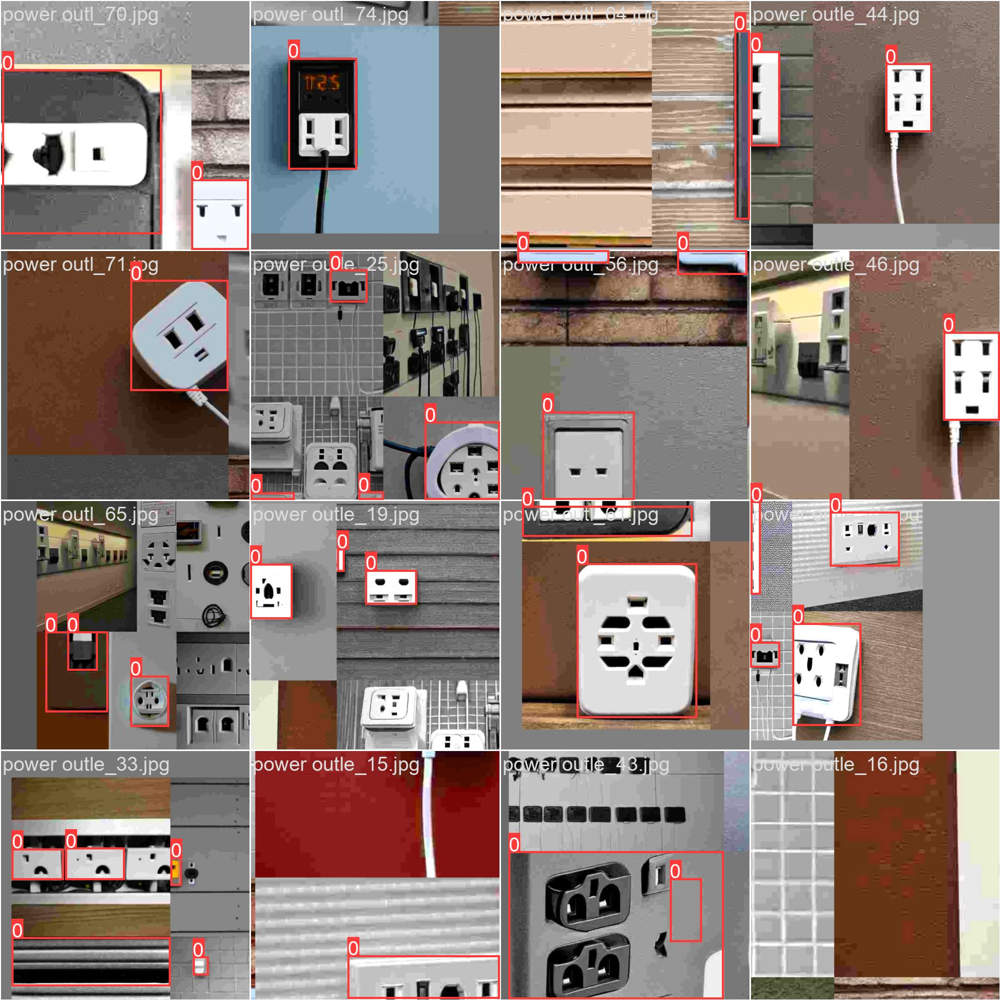

In [ ]:
from IPython.display import Image

file_paths = [
    f'{directory_path}/runs/detect/train/train_batch0.jpg',
    f'{directory_path}/runs/detect/train/train_batch1.jpg',
    f'{directory_path}/runs/detect/train/train_batch2.jpg'
]

for file_path in file_paths:
    display(Image(filename=file_path, width=600))

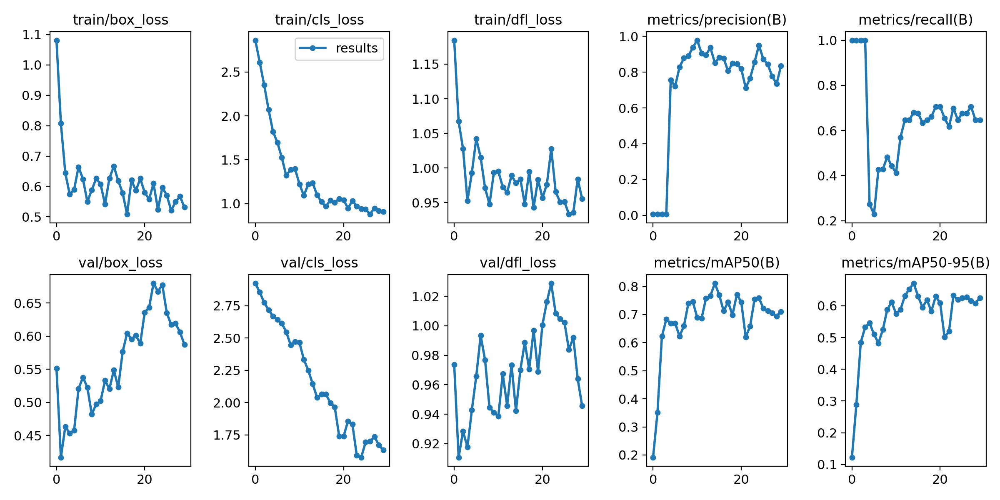

In [ ]:
Image(filename=f'{directory_path}/runs/detect/train/results.png', width=600)

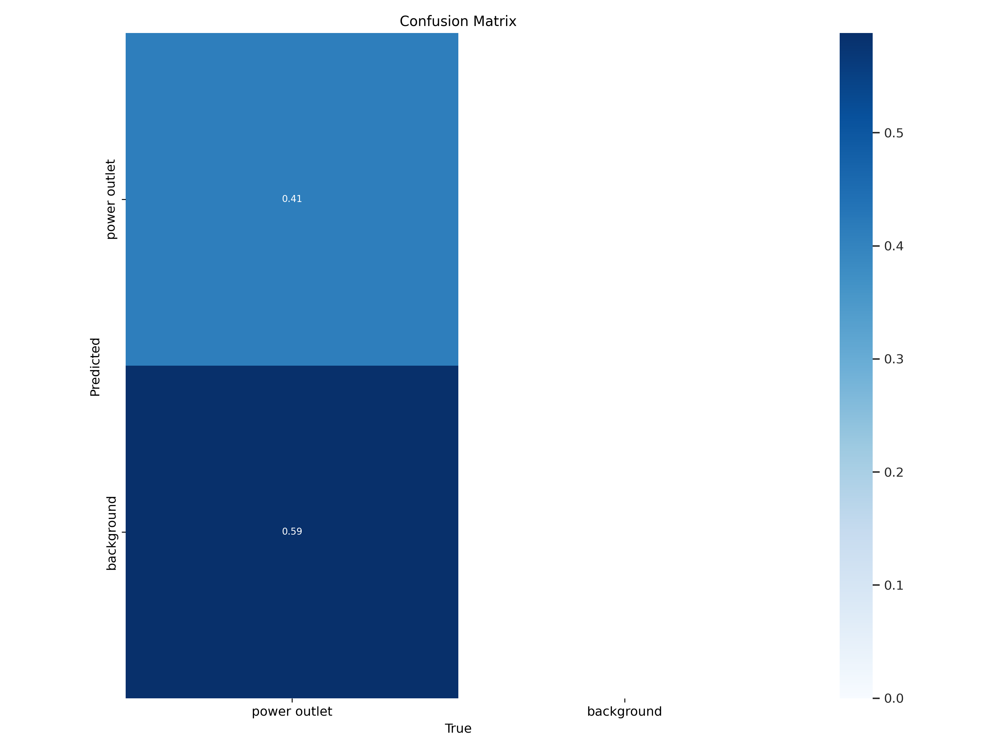

In [ ]:
Image(filename=f'{directory_path}/runs/detect/train/confusion_matrix.png', width=600)

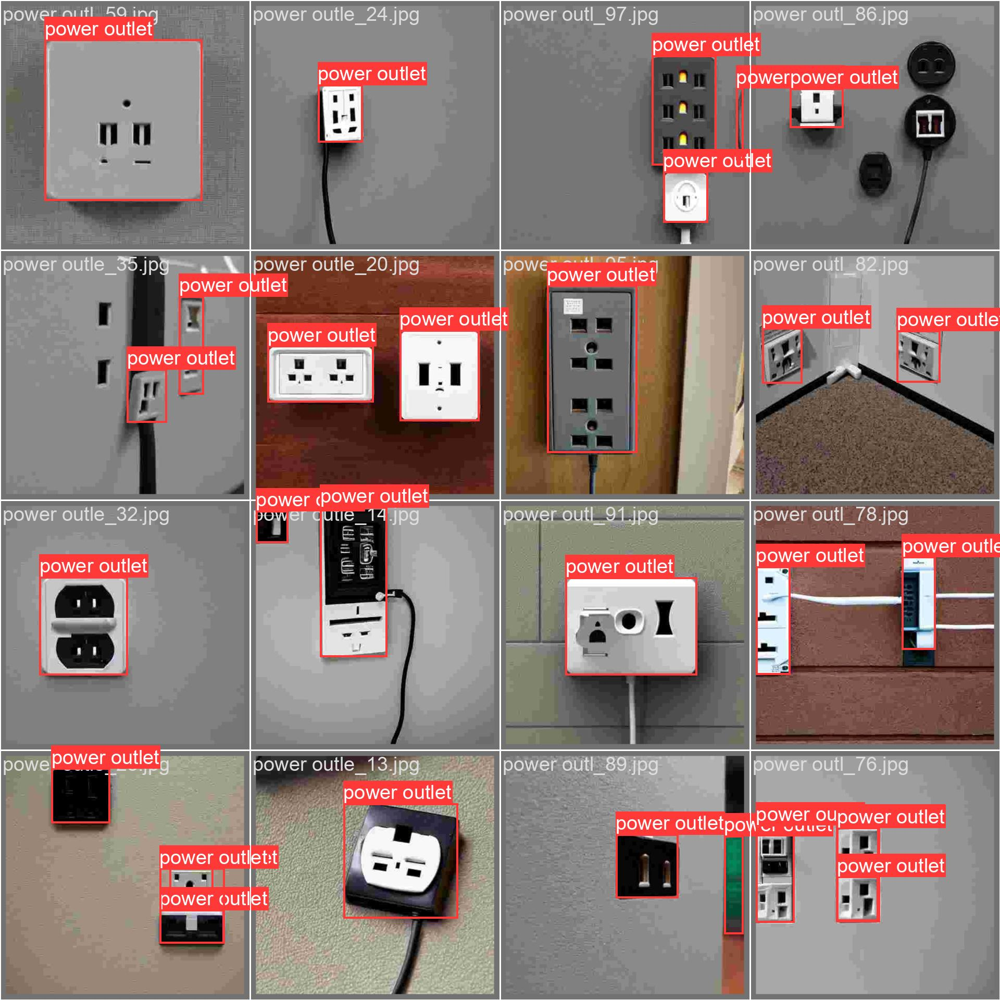

In [ ]:
Image(filename=f'{directory_path}/runs/detect/train/val_batch0_labels.jpg', width=600)

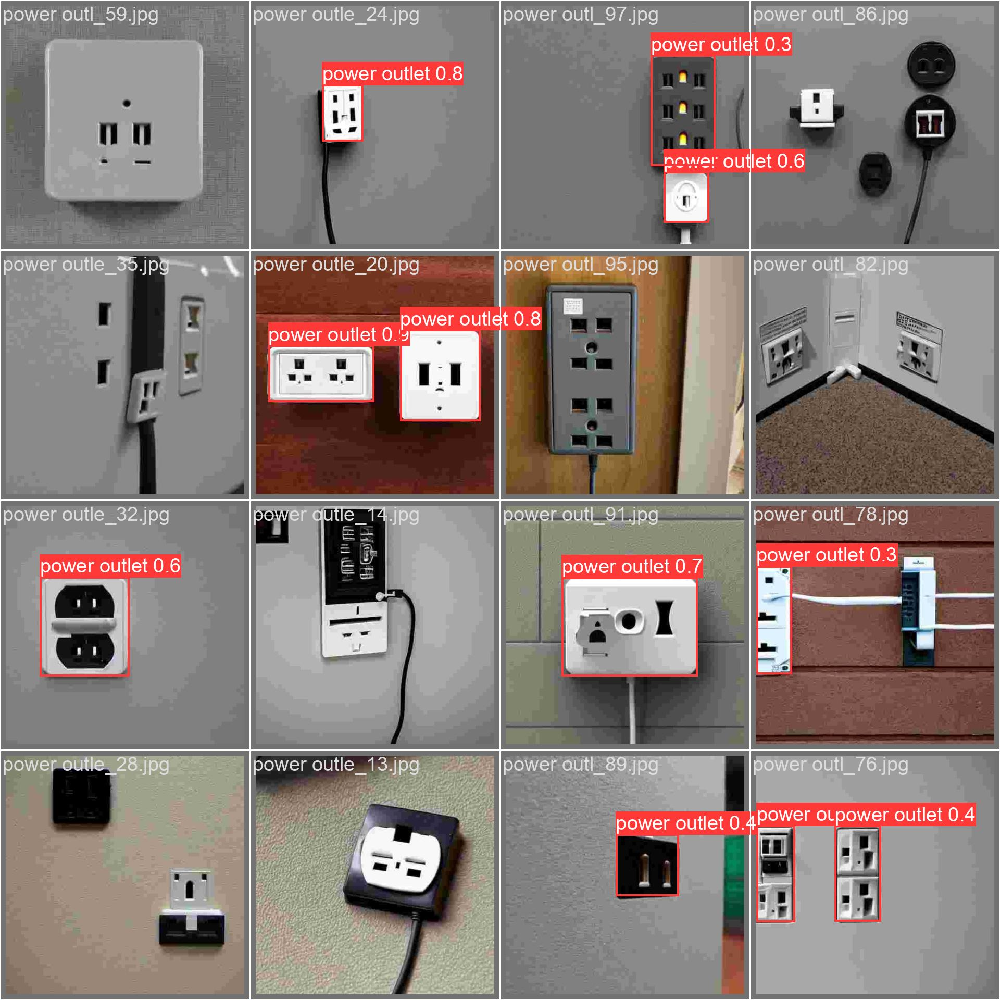

In [ ]:
Image(filename=f'{directory_path}/runs/detect/train/val_batch0_pred.jpg', width=600)

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!pip install roboflow

In [ ]:
import os

os.chdir(directory_path)
print("Current Directory:", os.getcwd())

from roboflow import Roboflow
rf = Roboflow(api_key="u01WhJv4xeBP6ceylN5o")
project = rf.workspace("yolov5-power-socket-detection").project("power-socket-detection-jbgd5")
dataset = project.version(1).download("yolov8")

# from roboflow import Roboflow
# rf = Roboflow(api_key="u01WhJv4xeBP6ceylN5o")
# project = rf.workspace("luka-trikha").project("outlets-3wtws")
# dataset = project.version(3).download("yolov8")

Current Directory: /content/drive/MyDrive/AAAI
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.81, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Power-Socket-Detection-1 in yolov8:: 100%|██████████| 2018/2018 [00:17<00:00, 118.22it/s]


In [ ]:
import shutil
import os

test_directry = "Power-Socket-Detection-1" #@param {type:"string"}

source = os.path.join(directory_path, f'{test_directry}/data.yaml')
destination = os.path.join(directory_path, "data.yaml")

source2 = os.path.join(directory_path, f'{test_directry}/test')
destination2 = os.path.join(directory_path, "test")

shutil.move(source, destination)
shutil.move(source2, destination2)

'/content/drive/MyDrive/AAAI/test'

In [ ]:
import os

os.chdir(directory_path)
print("Current Directory:", os.getcwd())

!yolo task=detect mode=val split=test model={directory_path}/runs/detect/train/weights/best.pt data={directory_path}/data.yaml

Current Directory: /content/drive/MyDrive/AAAI
2024-01-12 13:57:23.883518: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-12 13:57:23.883638: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-12 13:57:23.996804: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Ultralytics YOLOv8.0.81 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/drive/MyDrive/AAAI/test/labels... 101 images, 0 backgrounds, 0 corrupt: 100% 101/101 [00:01<00:00, 79.00it/s]
val: New cache created: /content/drive/MyDr

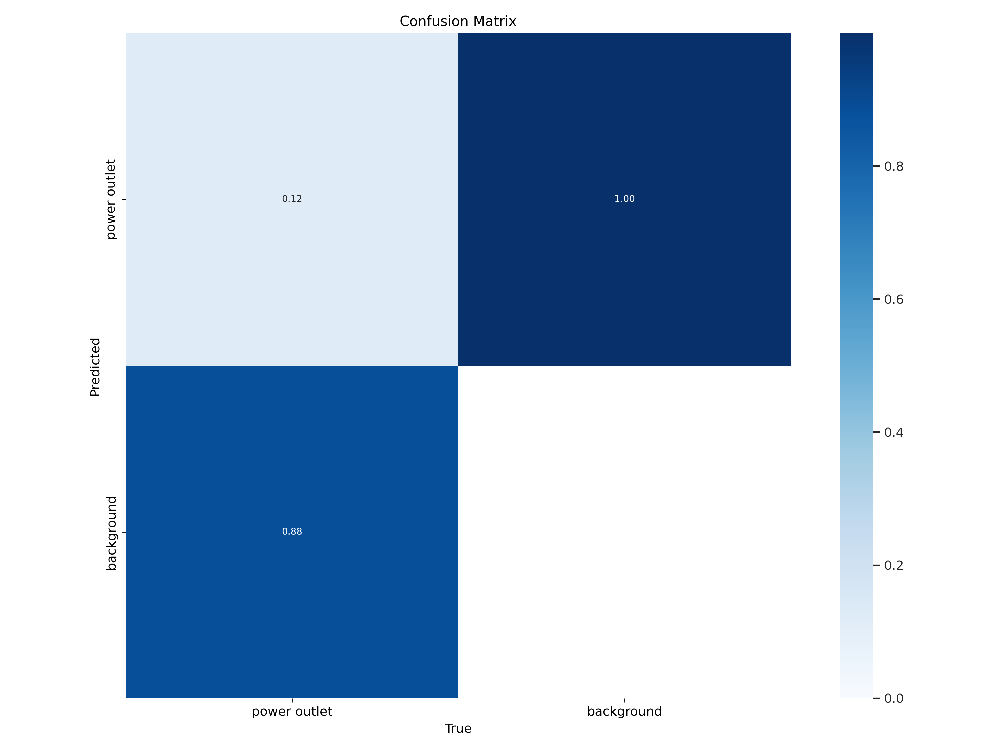

In [ ]:
from IPython.display import Image

Image(filename=f'{directory_path}/runs/detect/val/confusion_matrix.png', width=600)

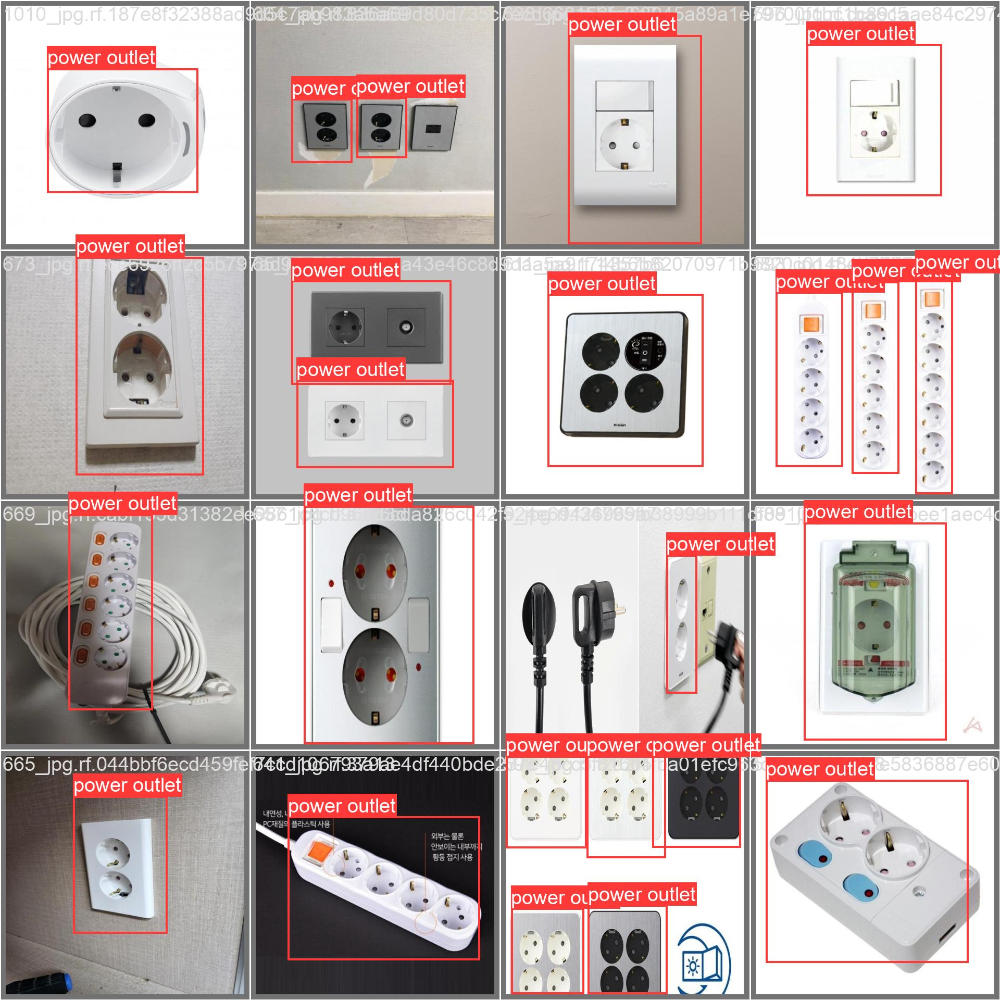

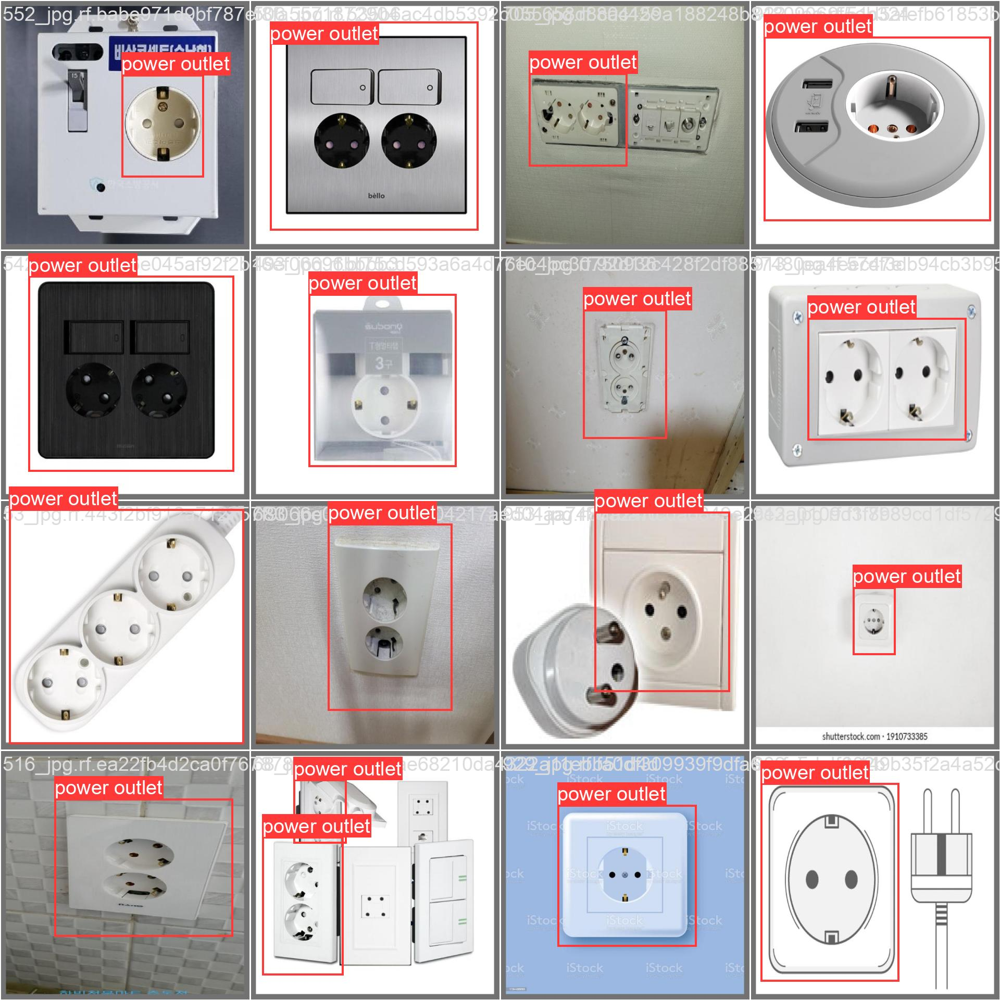

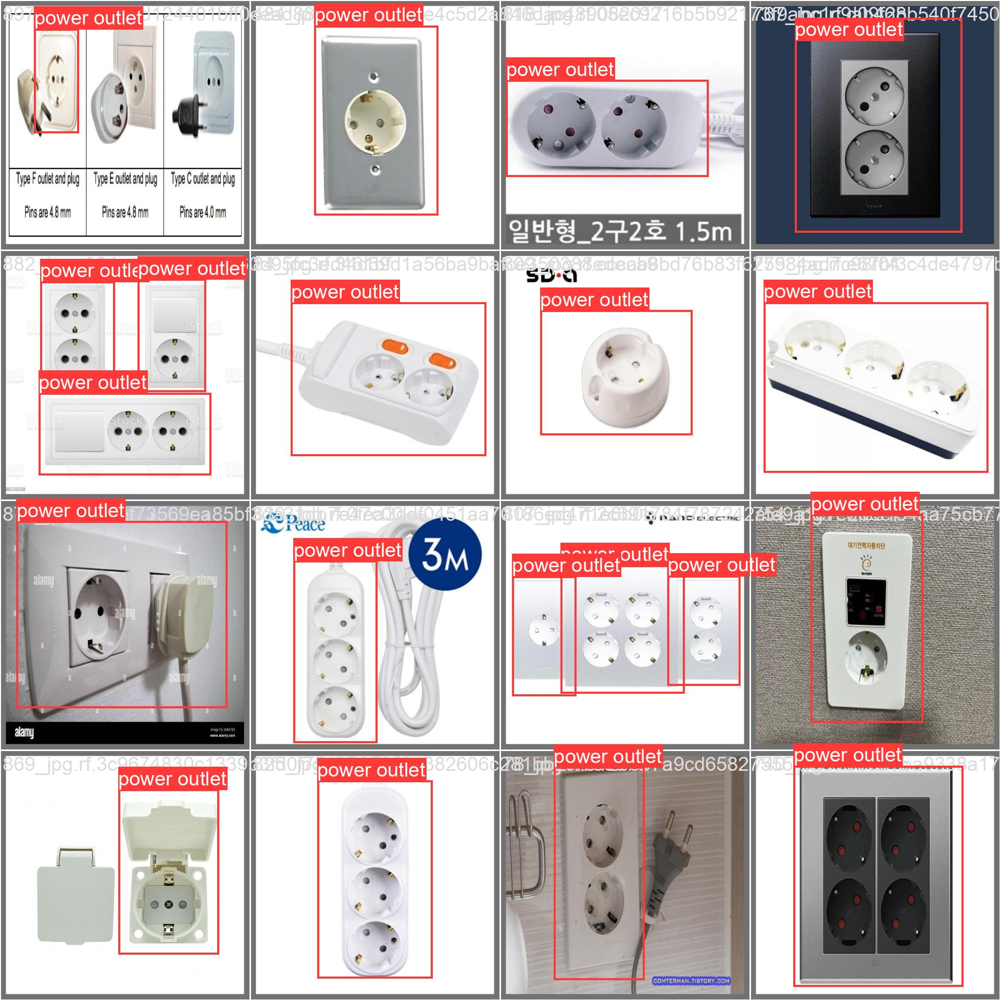

In [ ]:
file_paths = [
    f'{directory_path}/runs/detect/val/val_batch0_labels.jpg',
    f'{directory_path}/runs/detect/val/val_batch1_labels.jpg',
    f'{directory_path}/runs/detect/val/val_batch2_labels.jpg'
]

for file_path in file_paths:
    display(Image(filename=file_path, width=600))

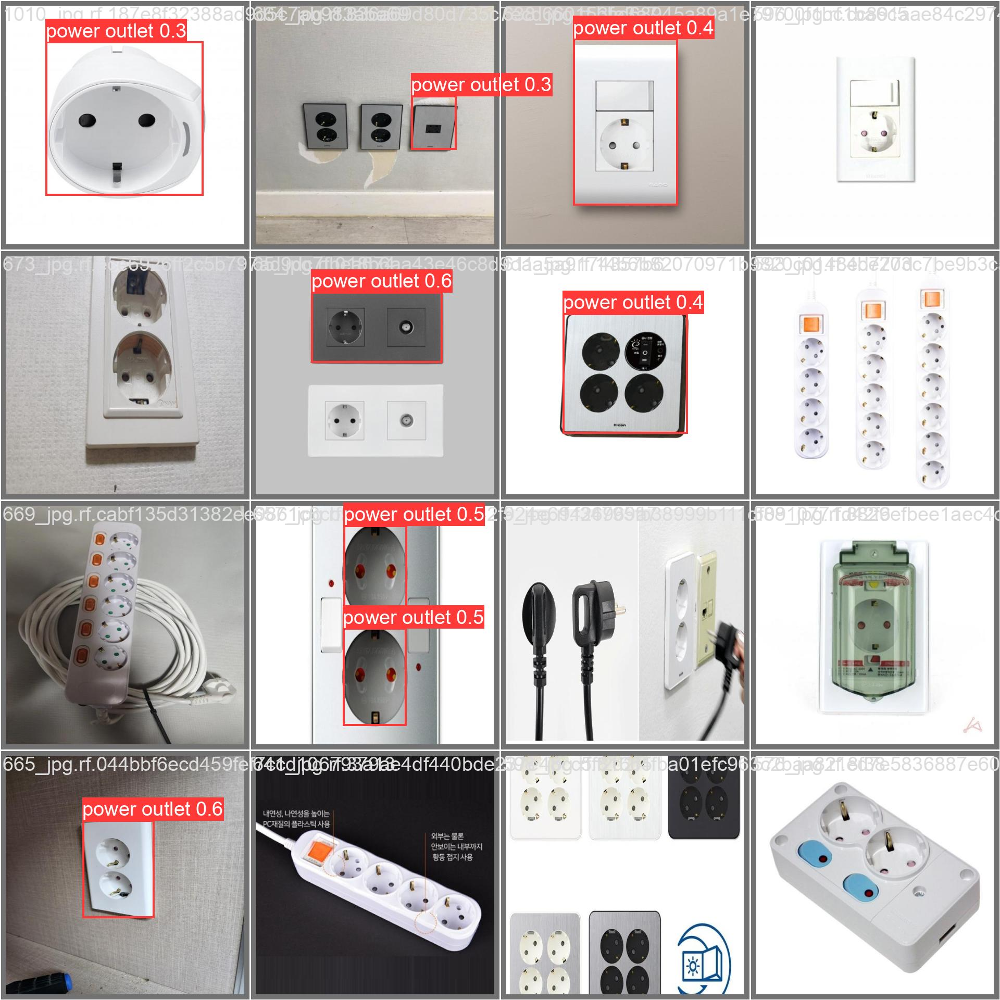

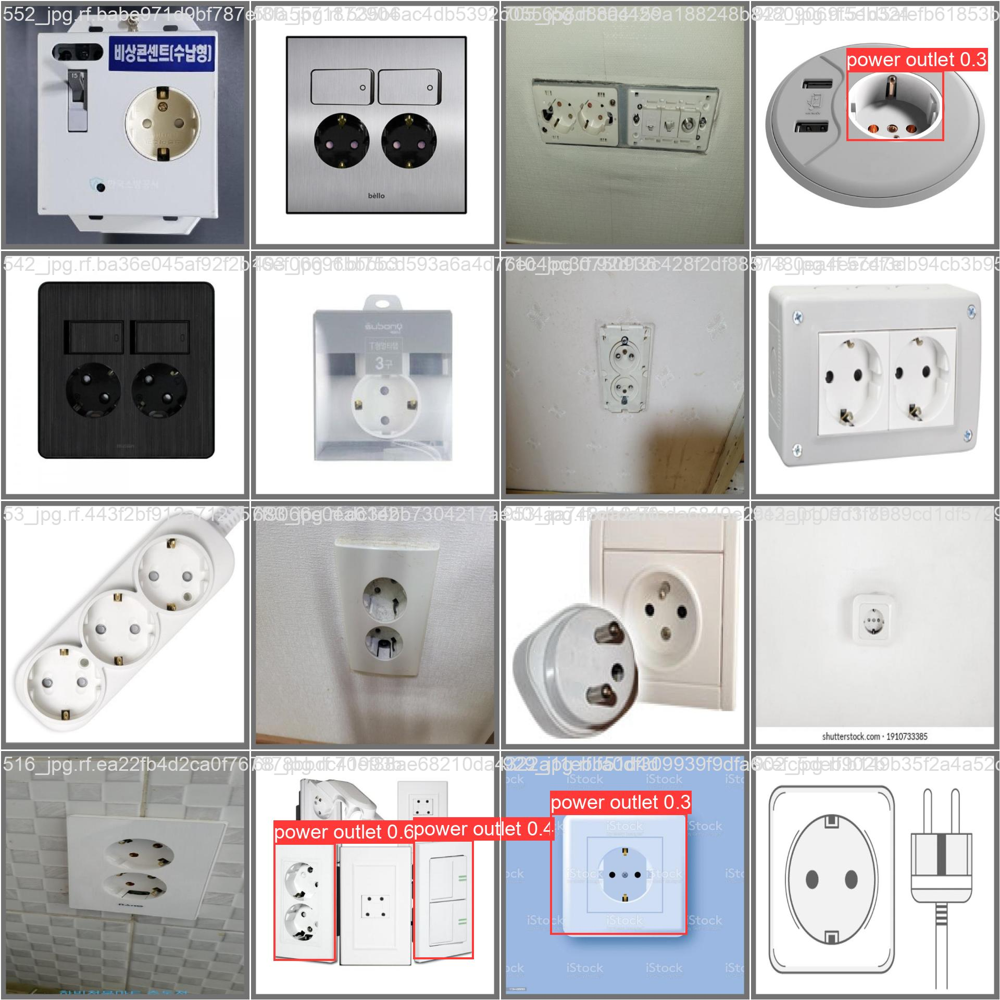

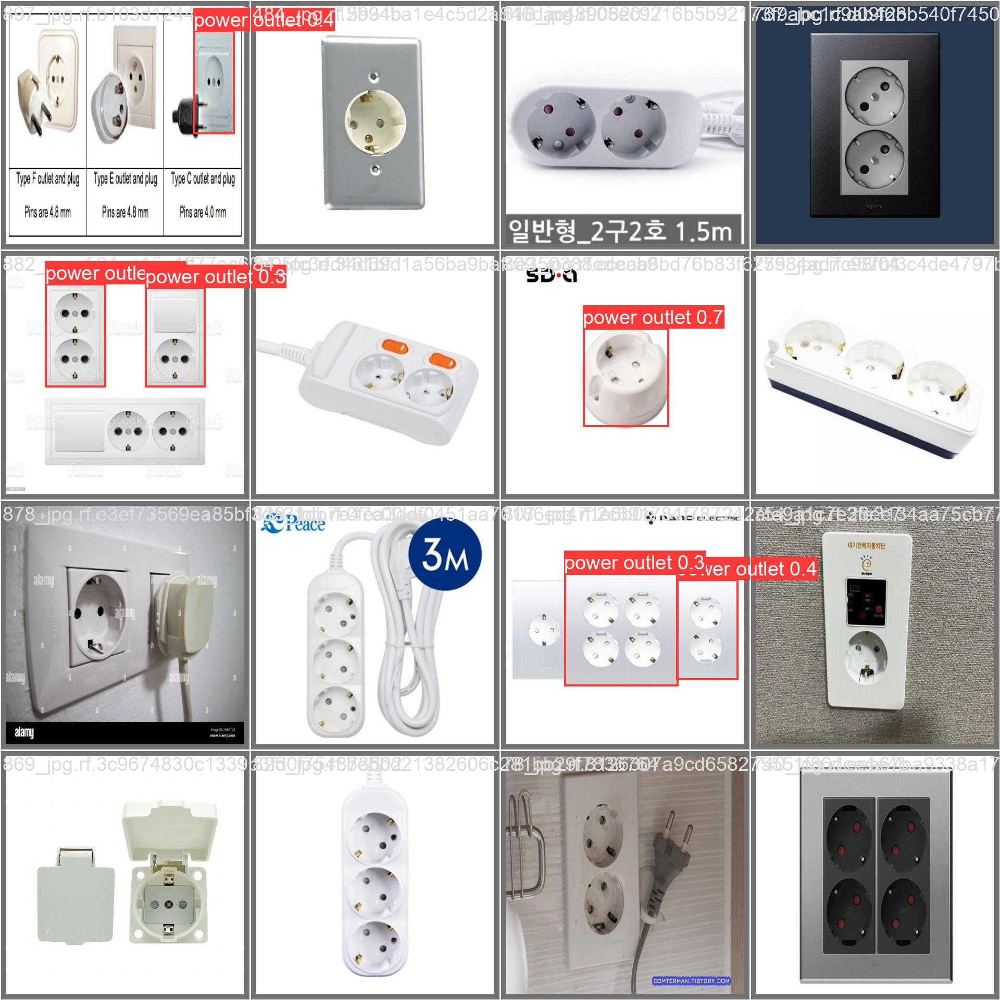

In [ ]:
file_paths = [
    f'{directory_path}/runs/detect/val/val_batch0_pred.jpg',
    f'{directory_path}/runs/detect/val/val_batch1_pred.jpg',
    f'{directory_path}/runs/detect/val/val_batch2_pred.jpg'
]

for file_path in file_paths:
    display(Image(filename=file_path, width=600))